In [ ]:
# Executado por Davi Silva Porto 09/05/2021
# 1. Importando a biblioteca pandas e numpy para executar a leitura dos dados e transforma-los em um Data-Frame = df 
import pandas as pd
import numpy as np
df = pd.read_csv('remuneracao.csv') 

In [ ]:
#métodos da biblioteca pandas para melhor visualização dos Dados no google Colab
pd.set_option('display.max_columns', None)
%load_ext google.colab.data_table

In [ ]:
# Apresantando os dados de entrada com 16012 linhas e 10 columns, muitos dados NaN
df

,NOME,ORGAO,CARGO,REMUNERACAO_DO_MES,FERIAS_E13_SALARIO,VANTAGENS_EVENTUAIS,LICENCA_PREMIO_INDENIZADA,ABONO_PERMANENCIA_E_OUTRAS_INDENIZACOES,REDUTOR_SALARIAL,TOTAL_LIQUIDO
0,JOSE BEZERRA DE MENEZES,ADM GERAL,COMPLEMENTACAO APOSENTADORIA - BANESPA,5776.15,NaN,NaN,NaN,NaN,NaN,2687.53
1,SANDRA DE CASSIA NAME,ADM GERAL,NAO CONSIDERAR,6222.25,NaN,NaN,NaN,NaN,NaN,4748.19
2,ESMERALDA CALEME A MARTINS,ADM GERAL,NAO CONSIDERAR,11702.88,NaN,NaN,NaN,NaN,NaN,10064.49
3,FRANCISCO DE OLIVEIRA,ADM GERAL,COMPLEMENTACAO APOSENTADORIA - BANESPA,6703.84,NaN,NaN,NaN,NaN,NaN,1591.04
4,KALLEY MENEZES,ADM GERAL,COMPLEMENTACAO APOSENTADORIA - BANESPA,7576.76,NaN,NaN,NaN,NaN,NaN,3598.35
...,...,...,...,...,...,...,...,...,...,...
16007,MARIA HELENA GONCALVES ALVES,ADM GERAL,COMPLEMENTACAO PENSAO - BANESPA,8900.17,NaN,NaN,NaN,NaN,NaN,4208.57
16008,SERGIO DE CICCIO,ADM GERAL,NAO CONSIDERAR,11702.88,NaN,NaN,NaN,NaN,NaN,8291.29
16009,CELICA CORTELINE ANDRADE,ADM GERAL,COMPLEMPENSAO - BADESP,11693.02,NaN,NaN,NaN,NaN,NaN,4439.29
16010,REGINA MARIA ZANATTA ESTRELLA,ADM GERAL,COMPLEMENTACAO DE PENSAO - VASP,10790.15,NaN,NaN,NaN,NaN,NaN,6029.24


In [ ]:
df=df.fillna(0)
#retirando dados NaN

In [ ]:
#instalando o pycaret
!pip install pycaret

In [ ]:
# ativando o pycaret no colab
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
#importando tudo no pycaret
from pycaret import *

In [ ]:
#definindo amostra de treinamento e teste - unseen
data = df.sample(frac=0.7, random_state=786)
data_unseen = df.drop(data.index)

df.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (11208, 10)
Unseen Data For Predictions: (4804, 10)


In [ ]:
#importando modulo de regressão do pycaret
from pycaret.regression import *
exp_reg101 = setup(data = data, target = 'TOTAL_LIQUIDO', session_id=123)

,Description,Value
0,session_id,123
1,Target,TOTAL_LIQUIDO
2,Original Data,"(11208, 10)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(7845, 7851)"


In [ ]:
#modelos disponíveis para teste no pycaret
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [ ]:
#criando o modelo com regreessão -Lasso, para verificar se conseguimos maior acurácia
lasso = create_model('lasso')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,827.4258,1.350563e+06,1162.1372,0.9287,0.4406,0.2494
1,763.9117,1.088794e+06,1043.4526,0.8736,0.4326,0.2437
2,791.3942,1.159843e+06,1076.9602,0.8654,0.4115,0.2345
3,801.0510,1.253393e+06,1119.5504,0.8652,0.3546,0.2467
4,775.8763,1.289921e+06,1135.7469,0.9222,0.3228,0.2150
5,794.4086,1.188933e+06,1090.3822,0.8722,0.3402,0.2543
6,752.5543,1.166610e+06,1080.0970,0.8569,0.3943,0.2161
7,817.0201,1.339290e+06,1157.2770,0.8542,0.2767,0.2158
8,830.5735,1.353230e+06,1163.2843,0.8721,0.3125,0.2363
9,736.2728,1.196919e+06,1094.0378,0.8656,0.2995,0.2212


In [ ]:
#imprimindo os dados do modelo
print(lasso)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=123,
      selection='cyclic', tol=0.0001, warm_start=False)


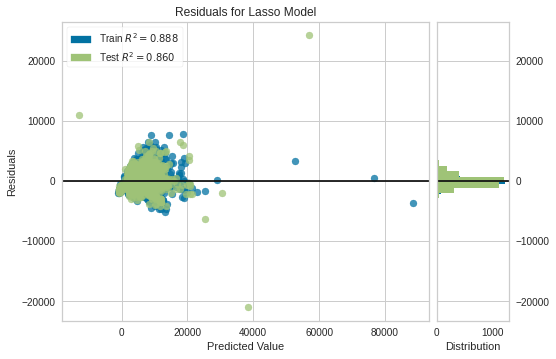

In [ ]:
#plotando a reta de regressão do modelo lasso  e os scores do R quadrado
plot_model(lasso)
#verificamos que os dados se ajustaram em 88,88% para amostra de treinamento e 86% para amostra de teste

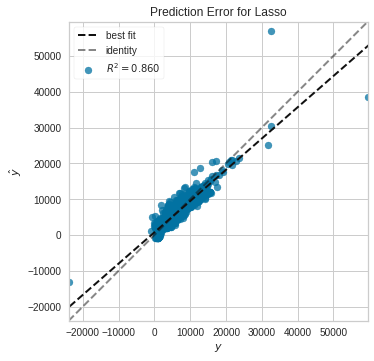

In [ ]:
#imprimindo os erros do modelo
plot_model(lasso, plot ='error')

In [ ]:
#imprimindo os scores de predição do modelo
predict_model(lasso);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Lasso Regression,802.143494,1535054.0,1238.973022,0.8601,0.3945,0.7165


In [ ]:
#imprimindo as previsões para os dados de teste
unseen_predictions = predict_model(lasso, data = data_unseen)
unseen_predictions.head()

,NOME,ORGAO,CARGO,REMUNERACAO_DO_MES,FERIAS_E13_SALARIO,VANTAGENS_EVENTUAIS,LICENCA_PREMIO_INDENIZADA,ABONO_PERMANENCIA_E_OUTRAS_INDENIZACOES,REDUTOR_SALARIAL,TOTAL_LIQUIDO,Label
0,SANDRA DE CASSIA NAME,ADM GERAL,NAO CONSIDERAR,6222.25,0.0,0.0,0.0,0.0,0.0,4748.19,4756.920410
1,CELSO FERNANDES MOREIRA,ADM GERAL,NAO CONSIDERAR,7606.87,0.0,0.0,0.0,0.0,0.0,3842.87,5650.259277
2,LUIZ ANTONIO RICCO NUNES,ADM GERAL,NAO CONSIDERAR,7271.20,0.0,0.0,0.0,0.0,0.0,5864.75,5433.689941
3,ANGELO ARTHUR MIRANDA FONTANA,ADM GERAL,NAO CONSIDERAR,6481.24,0.0,0.0,0.0,0.0,0.0,5459.88,4924.018066
4,MARIA LOURDES BEGHI ALENCAR,ADM GERAL,NAO CONSIDERAR,7773.93,0.0,0.0,0.0,0.0,0.0,5940.72,5758.044434


In [ ]:
#imprimindo metrica de checagem
from pycaret.utils import check_metric
check_metric(unseen_predictions.TOTAL_LIQUIDO, unseen_predictions.Label, 'R2')

0.8693

In [ ]:
#salvando o modelo
save_model(lasso,'Lasso 09May2021')

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='TOTAL_LIQUIDO',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_st...
                 ('fix_perfect', Remove_100(target='TOTAL_LIQUIDO')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
  

#Referências:
https://www.kaggle.com/harlfoxem/housesalesprediction

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

https://scikit-learn.org/stable/auto_examples/linear_model/plot_ols.html#sphx-glr-auto-examples-linear-model-plot-ols-py

https://scikit-learn.org/stable/modules/model_evaluation.html#mean-squared-error

https://github.com/pycaret/pycaret/blob/master/tutorials/Regression%20Tutorial%20Level%20Beginner%20-%20REG101.ipynb

https://medium.com/machina-sapiens/algoritmos-de-aprendizagem-de-m%C3%A1quina-qual-deles-escolher-67040ad68737

https://stackoverflow.com/questions/51196227/python-plotting-and-linear-regression-x-and-y-must-be-the-same-size/51196339
